In [1]:
from angio_da import *
#%%
import pandas as pd
import scipy.stats as stats
import scipy.special as special
import matplotlib.pyplot as plt
import numpy as np
import os
from os.path import join
import matplotlib.cm as cm
import re
import pandas as pd

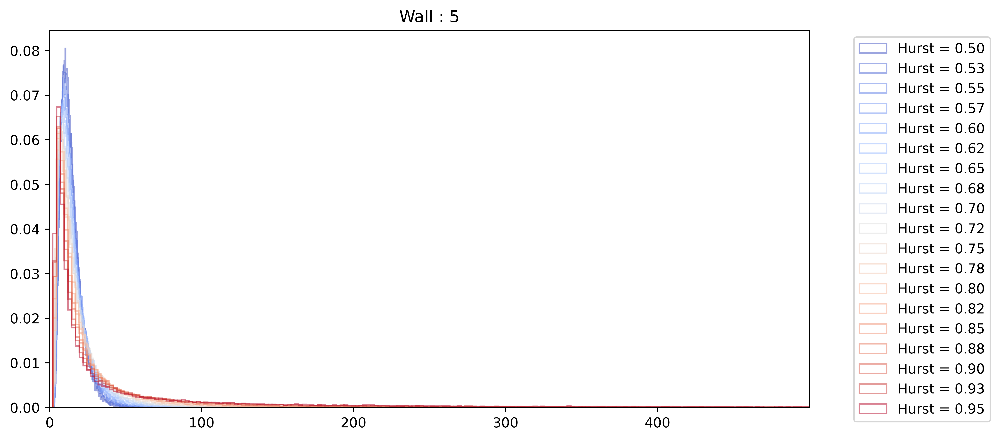

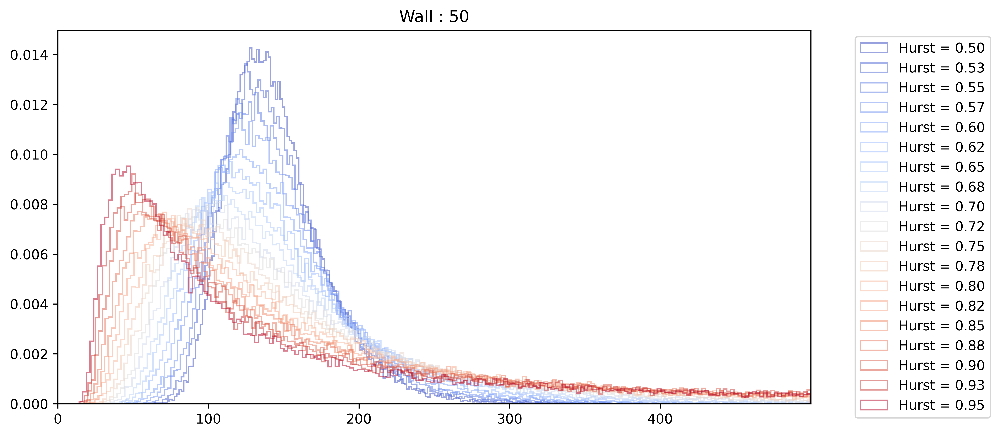

In [2]:
folder = 'exponential_h_wall_cluster'
exponential_data = os.listdir('exponential_h_wall_cluster')

# print(exponential_data)   
dict_exponential = {} 
dict_exponential_reversed = {}
for file in exponential_data:
    # initialize the dictionary of said H
    list_hitime = pd.read_csv(os.path.join(folder, file))
    split__file = file.split('__')
    h = split__file[0].split('_')[-1]
    wall = split__file[1].split('_')[-1].split('.csv')[0]
    
    h = round(float(h),3)
    wall = int(float(wall))
    
    if h not in dict_exponential.keys():
        dict_exponential[h] = {}
    if wall not in dict_exponential_reversed.keys():
        dict_exponential_reversed[wall] = {}
    dict_exponential[h][wall] = list_hitime.values
    mask = list_hitime.values < list_hitime.values.max()
    dict_exponential_reversed[wall][h] = list_hitime[mask]
del dict_exponential_reversed[0]
    
    
# plot_ks_pval(dict_exponential_reversed, 0.5, log = True, signif = 0.05)   
# plot_kl_distance(dict_exponential_reversed, 0.5)
# plot_mwu_pval(dict_exponential_reversed, 0.5, log = False, signif = 0.05)
# plot_hellinger_distance(dict_exponential_reversed, 0.5)
figures = []

for wall in dict_exponential_reversed.keys():
    if wall == 50 or wall == 5:
        
        fig, ax = wall_plot(dict_exponential_reversed, wall, plot_median=False, kde_plot = False, n_bins=200)
        fig.canvas.draw()
        figures.append(fig)


/var/folders/zv/p838yyl57rb2tlk802d5y2hh0000gn/T/ipykernel_71443/2670972819.py:10: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_all.tight_layout()


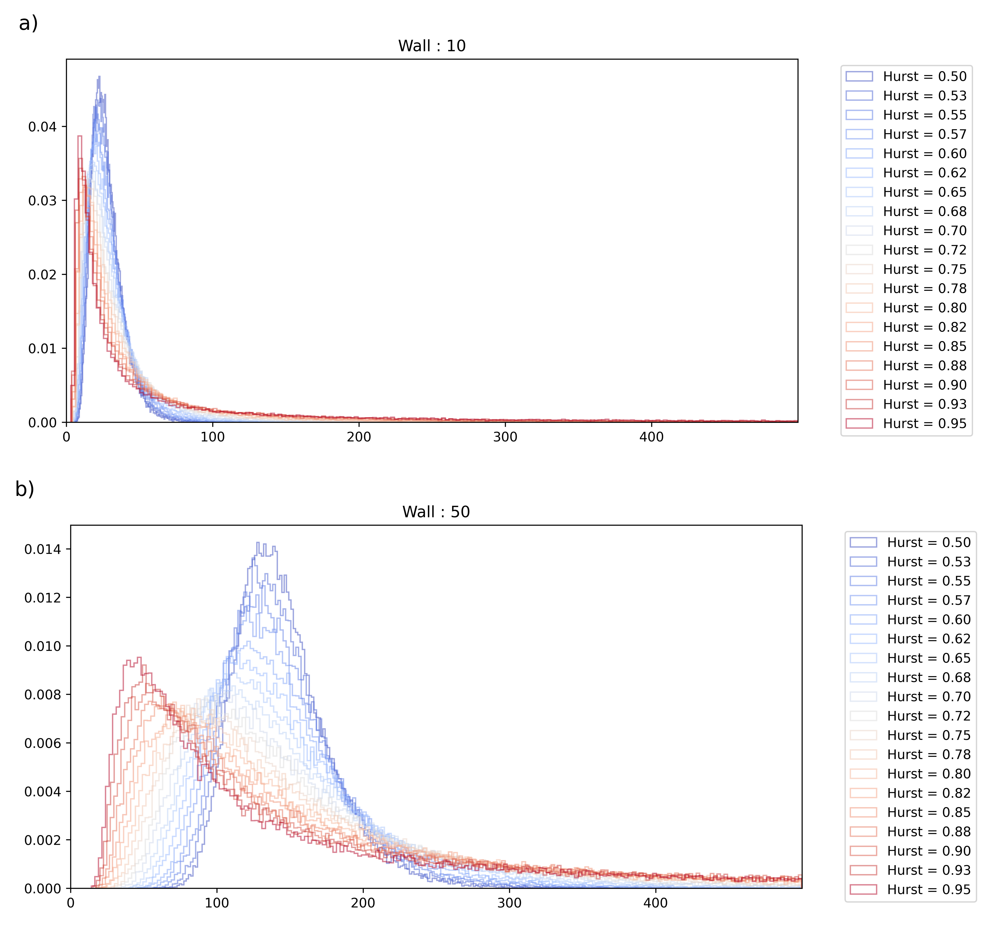

In [9]:
fig_all, axes = plt.subplots(2, 1, figsize=(10,8), dpi = 600, gridspec_kw={'hspace': 0.1})

index_alpha = {0: 'a)', 1: 'b)', 2: 'c)', 3: 'd)', 4: 'e)', 5: 'f)'}
figures = figures[::-1]
for i, (fig, ax) in enumerate(zip(figures, axes)):
    ax.imshow(fig.canvas.renderer._renderer)
    ax.axis('off')
    ax.text(0, 1, index_alpha[i], transform=ax.transAxes)
    
fig_all.tight_layout()

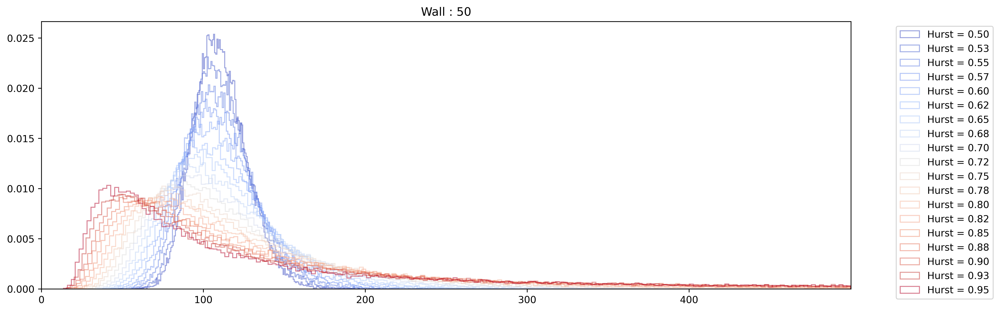

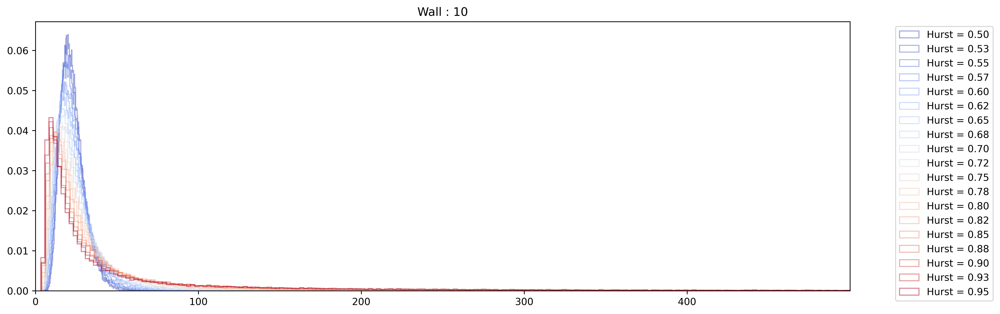

In [3]:
folder = 'constant_h_wall_cluster'
constant_data = os.listdir(folder)

# print(exponential_data)   
dict_constant = {} 
dict_constant_reversed = {}
for file in constant_data:
    # initialize the dictionary of said H
    list_hitime = pd.read_csv(os.path.join(folder, file))
    split__file = file.split('__')
    h = split__file[0].split('_')[-1]
    wall = split__file[1].split('_')[-1].split('.csv')[0]
    
    h = round(float(h),3)
    wall = int(float(wall))
    
    if h not in dict_constant.keys():
        dict_constant[h] = {}
    if wall not in dict_constant_reversed.keys():
        dict_constant_reversed[wall] = {}
    dict_constant[h][wall] = list_hitime.values
    dict_constant_reversed[wall][h] = list_hitime
    mask = list_hitime.values < list_hitime.values.max()
    dict_constant_reversed[wall][h] = list_hitime[mask]
del dict_constant_reversed[0]
    
    
# plot_ks_pval(dict_constant_reversed, 0.5, log = True, signif = 0.05)   
# plot_hellinger_distance(dict_constant_reversed, 0.5)
# plot_kl_distance(dict_constant_reversed, 0.5)
# plot_mwu_pval(dict_constant_reversed, 0.5, log = False, signif = 0.05)

for wall in dict_constant_reversed.keys():
    if wall == 50:
        wall_plot(dict_constant_reversed, wall, plot_median=False, kde_plot = False, n_bins=200)
    if wall == 10:
        wall_plot(dict_constant_reversed, wall, plot_median=False, kde_plot=False, n_bins=200)

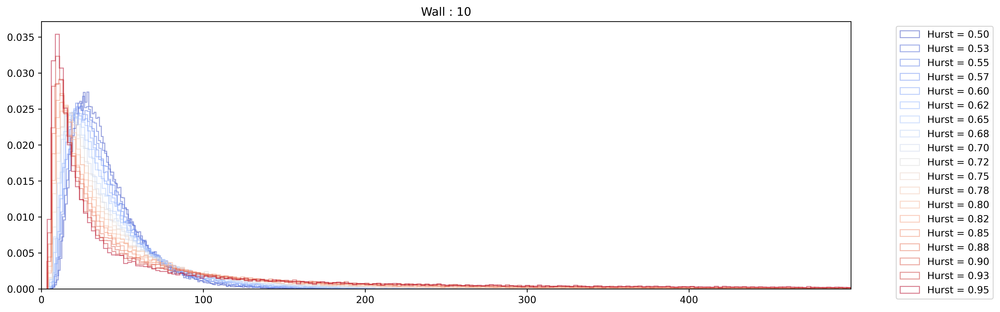

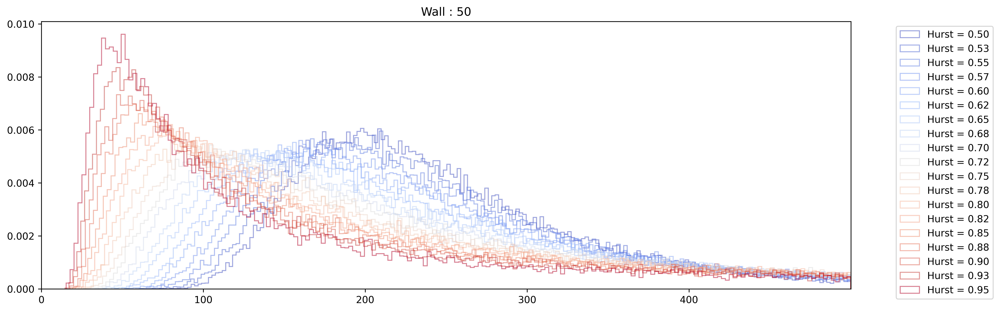

In [4]:
folder = 'linear_h_wall_cluster'
linear_data = os.listdir(folder)

# print(exponential_data)   
dict_linear = {} 
dict_linear_reversed = {}
for file in linear_data:
    # initialize the dictionary of said H
    list_hitime = pd.read_csv(os.path.join(folder, file))
    split__file = file.split('__')
    h = split__file[0].split('_')[-1]
    wall = split__file[1].split('_')[-1].split('.csv')[0]
    
    h = round(float(h),3)
    wall = int(float(wall))
    
    if h not in dict_linear.keys():
        dict_linear[h] = {}
    if wall not in dict_linear_reversed.keys():
        dict_linear_reversed[wall] = {}
    dict_linear[h][wall] = list_hitime.values
    dict_linear_reversed[wall][h] = list_hitime
    mask = list_hitime.values < list_hitime.values.max()
    dict_linear_reversed[wall][h] = list_hitime[mask]
del dict_linear_reversed[0]
    
    
# plot_ks_pval(dict_constant_reversed, 0.5, log = True, signif = 0.05)   
# plot_hellinger_distance(dict_constant_reversed, 0.5)
# plot_kl_distance(dict_constant_reversed, 0.5)
# plot_mwu_pval(dict_constant_reversed, 0.5, log = False, signif = 0.05)

for wall in dict_linear_reversed.keys():
    if wall == 50:
        wall_plot(dict_linear_reversed, wall, plot_median=False, kde_plot = False, n_bins=200)
    if wall == 10:
        wall_plot(dict_linear_reversed, wall, plot_median=False, kde_plot=False, n_bins=200)

100%|██████████| 24/24 [00:06<00:00,  3.57it/s]


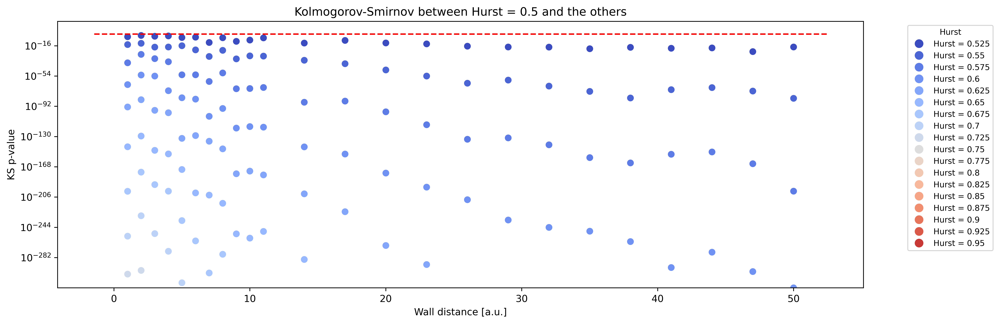

100%|██████████| 24/24 [00:06<00:00,  3.98it/s]


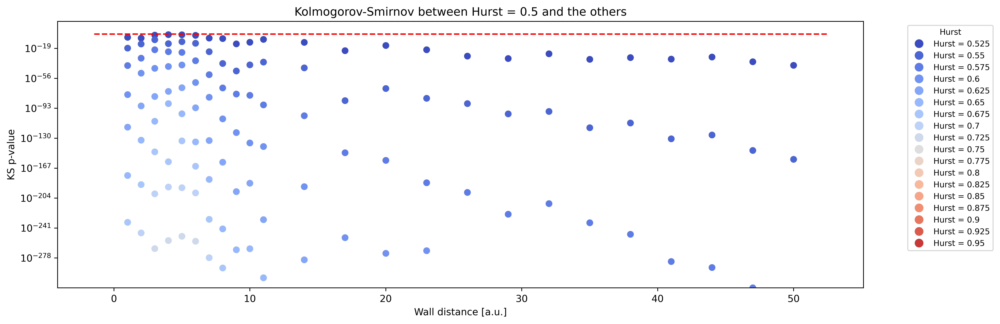

100%|██████████| 24/24 [00:07<00:00,  3.38it/s]


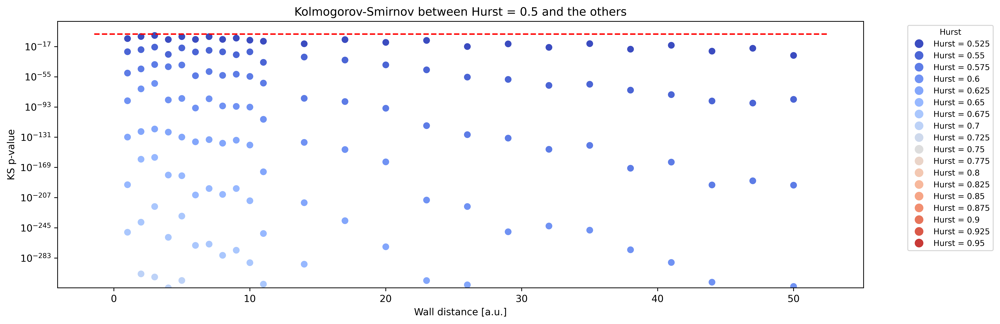

In [ ]:
plot_ks_pval(dict_constant_reversed, 0.5, log = True, signif = 0.05)
plot_ks_pval(dict_linear_reversed, 0.5, log = True, signif = 0.05)
plot_ks_pval(dict_exponential_reversed, 0.5, log = True, signif = 0.05)


In [13]:
a = [0.5, 0.5, 0]
b = [0.5, 0.1, 0.5]
np.sum(special.rel_entr(a, b))

np.float64(0.8047189562170501)

100%|██████████| 24/24 [00:01<00:00, 15.05it/s]


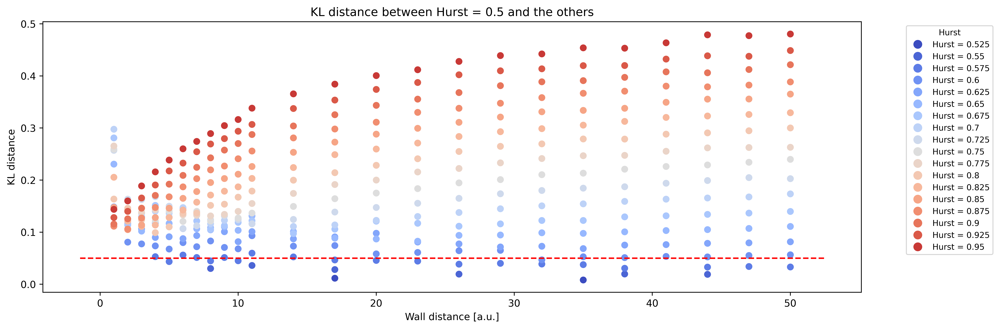

In [3]:
plot_kl_distance(dict_exponential_reversed, 0.5, log=False)

100%|██████████| 24/24 [00:01<00:00, 16.47it/s]


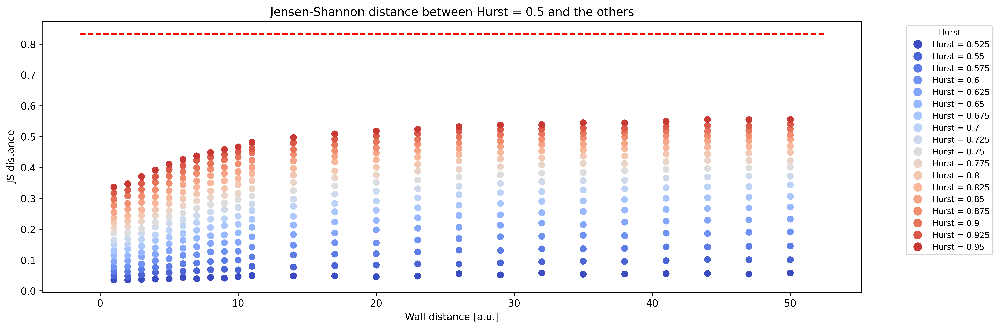

In [4]:
plot_js_distance(dict_exponential_reversed, 0.5, signif = np.sqrt(np.log(2)))


In [5]:
plot_js_distance(dict_constant_reversed, 0.5, log = True, signif = np.sqrt(np.log(2)))
plot_js_distance(dict_linear_reversed, 0.5, log = True, signif = np.sqrt(np.log(2)))    
plot_js_distance(dict_exponential_reversed, 0.5, log = True, signif = np.sqrt(np.log(2)))


NameError: name 'dict_constant_reversed' is not defined

100%|██████████| 24/24 [00:01<00:00, 15.64it/s]


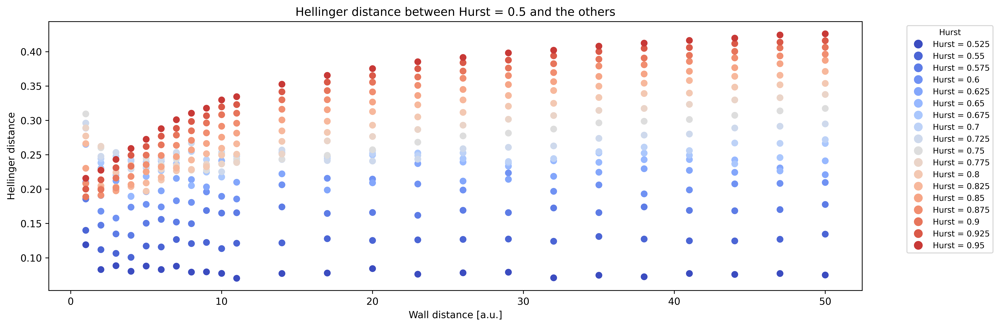

100%|██████████| 24/24 [00:01<00:00, 17.80it/s]


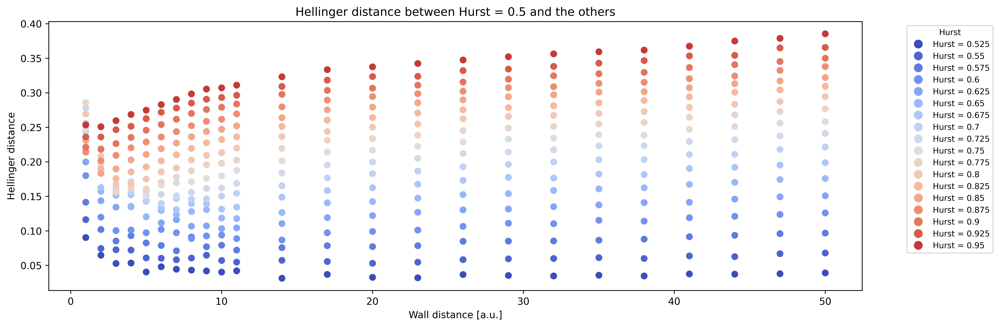

100%|██████████| 24/24 [00:01<00:00, 15.83it/s]


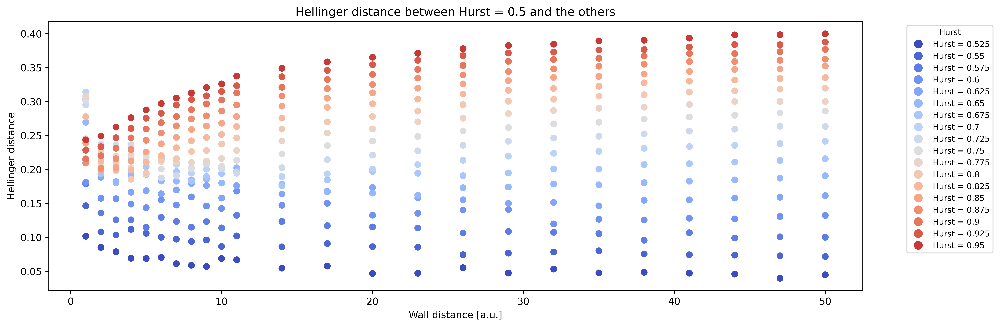

In [8]:
plot_hellinger_distance(dict_constant_reversed, 0.5)
plot_hellinger_distance(dict_linear_reversed, 0.5)
plot_hellinger_distance(dict_exponential_reversed, 0.5)

100%|██████████| 24/24 [00:06<00:00,  3.89it/s]


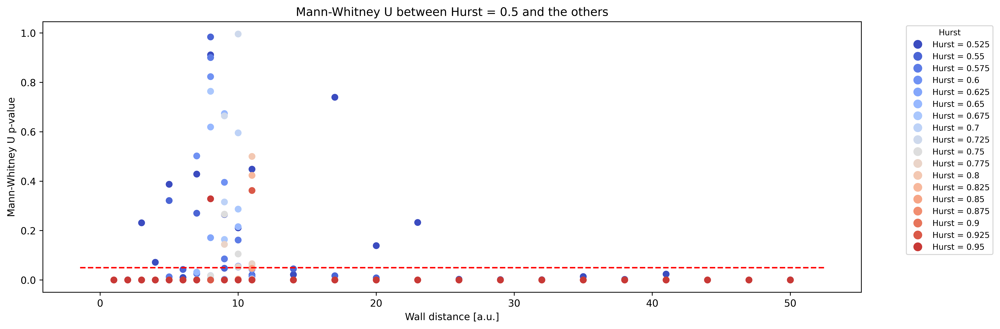

In [6]:
# plot_mwu_pval(dict_constant_reversed, 0.5, log = False, signif = 0.05)
# plot_mwu_pval(dict_linear_reversed, 0.5, log = False, signif = 0.05)
plot_mwu_pval(dict_exponential_reversed, 0.5, log = False, signif = 0.05)

  4%|▍         | 1/24 [00:03<01:28,  3.86s/it]

 21%|██        | 5/24 [00:19<01:13,  3.86s/it]

 42%|████▏     | 10/24 [00:38<00:53,  3.80s/it]

 50%|█████     | 12/24 [00:45<00:45,  3.79s/it]

 54%|█████▍    | 13/24 [00:49<00:41,  3.81s/it]

 62%|██████▎   | 15/24 [00:57<00:34,  3.81s/it]

 71%|███████   | 17/24 [01:04<00:26,  3.83s/it]

 75%|███████▌  | 18/24 [01:08<00:22,  3.83s/it]

 88%|████████▊ | 21/24 [01:20<00:11,  3.82s/it]

 96%|█████████▌| 23/24 [01:27<00:03,  3.86s/it]

100%|██████████| 24/24 [01:31<00:00,  3.83s/it]


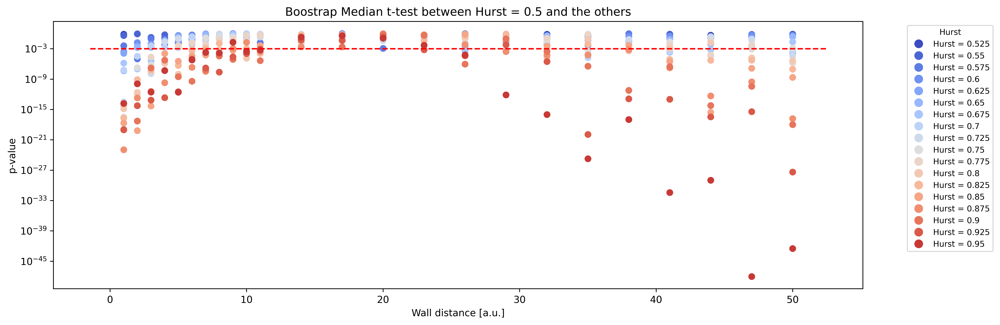

In [3]:
# plot_median_boostrap_ttest(dict_constant_reversed, 0.5, log = True, signif = 0.001, n_cpu = 10, n_samples = 1000, n_boostrap = 200)
# plot_median_boostrap_ttest(dict_linear_reversed, 0.5, log = True, signif = 0.001, n_cpu = 10, n_samples = 1000, n_boostrap = 200)
plot_median_boostrap_ttest(dict_exponential_reversed, 0.5, log = True, signif = 0.001, n_cpu = 10, n_samples = 1000, n_boostrap = 200)